In [2]:
# %%
# ============================================================
# IMPORTS
# ============================================================
import pandas as pd
import seaborn as sns
import re
import matplotlib.pyplot as plt
import requests
from bs4 import BeautifulSoup

# %%
# ============================================================
# LOAD DATA
# ============================================================
inspection = pd.read_csv('/Users/kamilalim/Desktop/Wellesley/Semester_8/DS_340H/Project/BostonFoodInspections/Boston_inspection.csv', low_memory=False)

print("Shape:", inspection.shape)
print(inspection.info())

Shape: (871066, 26)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 871066 entries, 0 to 871065
Data columns (total 26 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   businessname  871066 non-null  object 
 1   dbaname       8294 non-null    object 
 2   legalowner    567638 non-null  object 
 3   namelast      871066 non-null  object 
 4   namefirst     500708 non-null  object 
 5   licenseno     871066 non-null  int64  
 6   issdttm       870217 non-null  object 
 7   expdttm       870433 non-null  object 
 8   licstatus     871066 non-null  object 
 9   licensecat    871066 non-null  object 
 10  descript      871066 non-null  object 
 11  result        871066 non-null  object 
 12  resultdttm    864668 non-null  object 
 13  violation     810855 non-null  object 
 14  viol_level    810855 non-null  object 
 15  violdesc      804613 non-null  object 
 16  violdttm      810852 non-null  object 
 17  viol_status   810855 non-nul

In [3]:
# %%
# ============================================================
# STANDARDIZATION FUNCTIONS
# ============================================================

def standardize_name(name):
    if pd.isna(name): return "unknown"
    name = str(name).lower()
    name = re.sub(r'\bno\b', '', name)
    name = re.sub(r'\b(llc|inc|corp|corporation|ltd|group|co|company)\b', '', name)
    name = re.sub(r'[^\w\s]', '', name)
    name = re.sub(r'\b(\w)\s+(\w)\b', r'\1\2', name)
    return " ".join(name.split())

def standardize_address(addr):
    if pd.isna(addr): return "unknown"
    addr = str(addr).lower()
    addr = re.sub(r'\b(fl|floor|unit|ste|suite|level|rm|room|#)\b.*$', '', addr)
    addr = re.sub(r'\bst\b|\bstreet\b', 'st', addr)
    addr = re.sub(r'\bave\b|\bavenue\b', 'ave', addr)
    addr = re.sub(r'\brd\b|\broad\b', 'rd', addr)
    addr = re.sub(r'[^\w\s]', '', addr)
    return " ".join(addr.split()[:3])


In [4]:
# ============================================================
# CLEAN DATA
# ============================================================

# Keep only active licenses
inspection = inspection[inspection['licstatus'] == 'Active'].copy()

# Apply standardization
inspection['businessname_clean'] = inspection['businessname'].apply(standardize_name)
inspection['legalowner_clean'] = inspection['legalowner'].apply(standardize_name)
inspection['address_clean'] = inspection['address'].apply(standardize_address)

# Fix known name variants/duplicates
name_aliases = {
    'dominos pizza': 'dominos',
    'gongcha': 'gong cha',
    'wing stop': 'wingstop',
    'legal seafoods': 'legal sea foods',
    'legal sea food e3a34': 'legal sea foods',
    'legal sea foods b connector': 'legal sea foods',
    'legal sea food': 'legal sea foods',
    'legal sea': 'legal sea foods',
    'legal sea foods b': 'legal sea foods',
    'legal crossing': 'legal sea foods',
    'legal harborside': 'legal sea foods',
    'kentucky fried chicken': 'kfc',
    'starbucks coffee 7804': 'starbucks',
    'starbucks coffee 7808': 'starbucks',
    'dunkin donutsgalleria': 'dunkin donuts',
    'dunkin donuts mbta station': 'dunkin donuts',
    'whole foods marketcambridge st': 'whole foods market',
    'applebees neighborhood grill bar': 'applebees',
    'burger king 3483': 'burger king',
    'burger king 3531': 'burger king',
    'caffe nero express': 'caffe nero',
    'chipotle mexican grill 1520': 'chipotle mexican grill',
    'chipotle mexican grille': 'chipotle mexican grill',
    'dunkin donut': 'dunkin donuts',
    'dunkin': 'dunkin donuts',
    'dunkin donuts 0311': 'dunkin donuts',
    'dunkin donuts 209 north harvard st': 'dunkin donuts',
    'dunkin donuts 219 cambridge': 'dunkin donuts',
    'dunkin donuts 895 morton st': 'dunkin donuts',
    'dunkin donuts allston': 'dunkin donuts',
    'dunkin donuts at old colony': 'dunkin donuts',
    'dunkin donuts blue hill ave': 'dunkin donuts',
    'dunkin donuts canal st': 'dunkin donuts',
    'dunkin donuts causeway st': 'dunkin donuts',
    'dunkin donuts city place': 'dunkin donuts',
    'dunkin donuts kiosk': 'dunkin donuts',
    'dunkin donuts vfw pkwy': 'dunkin donuts',
    'dunkin donuts1138 washington st': 'dunkin donuts',
    'dunkin donutsca donuts': 'dunkin donuts',
    'dunkin donutsfranklin': 'dunkin donuts',
    'dunkin donutshyde pk ave': 'dunkin donuts',
    'dunkin donutsscnvanos': 'dunkin donuts',
    'dunkin donutswatermark': 'dunkin donuts',
    'dunkin donutswolcott sq': 'dunkin donuts',
    'dunkin station donuts': 'dunkin donuts',
    'dunkindonutswatermark': 'dunkin donuts',
    'dunkindonutwatermark': 'dunkin donuts',
    'ben jerrys kiosk': 'ben jerrys',
    'panera bread cafe 2137': 'panera bread',
    'panera bread cafe 2143': 'panera bread',
    'panera breadno 9315': 'panera bread',
    'papa johns pizza': 'papa johns',
    'jersey mikes subs': 'jersey mikes',
    'qdoba mexican eats 2592': 'qdoba',
    'raising canes chicken fingers': 'raising canes',
    'shake shackno 1431': 'shake shack',
    'starbucks coffee': 'starbucks',
    'starbucks coffee 10599': 'starbucks',
    'starbucks coffee 22253': 'starbucks',
    'starbucks coffee 22566': 'starbucks',
    'starbucks coffee 50497': 'starbucks',
    'starbucks coffee 7224': 'starbucks',
    'starbucks coffee 7550': 'starbucks',
    'starbucks coffee 7805': 'starbucks',
    'starbucks coffee 7823': 'starbucks',
    'starbucks coffee 801': 'starbucks',
    'starbucks coffee 822': 'starbucks',
    'starbucks coffee 872': 'starbucks',
    'starbucks coffee 9463': 'starbucks',
    'starbucksboston childrens hospital': 'starbucks',
    'taco bell 29265': 'taco bell',
    'wendys properties': 'wendys',
    'whole foods marketcambridge st': 'whole foods market',
    'applebees neighborhood grill bar': 'applebees',
}
inspection['businessname_clean'] = inspection['businessname_clean'].replace(name_aliases)


In [5]:
# %%
# ============================================================
# SCRAPE NATIONAL CHAINS
# ============================================================

url = "https://www.restaurantbusinessonline.com/top-500-2020"
headers = {"User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/120.0.0.0 Safari/537.36"}

response = requests.get(url, headers=headers)
soup = BeautifulSoup(response.text, 'html.parser')
table = soup.find(class_='table-sortable')
links = table.find_all('a') if table else []
scraped_chains = [standardize_name(link.get_text(strip=True)) for link in links]

# Supplement with additional known national chains
additional_chains = [
    "applebees", "ihop", "dennys", "five guys", "shake shack",
    "little caesars", "papa johns", "jimmy johns", "jersey mikes",
    "firehouse subs", "wingstop", "buffalo wild wings", "red lobster",
    "outback steakhouse", "longhorn steakhouse", "cheesecake factory",
    "arbys", "quiznos", "blaze pizza", "mod pizza", "sweetgreen", "cava",
    "noodles and company", "qdoba", "del taco", "white castle",
    "boston market", "tim hortons", "caffe nero", "ben jerrys",
    "daves hot chicken", "bartaco", "blank street coffee",
    "blue bottle coffee", "whole foods market", "legal sea foods",
    "just salad", "honeygrow", "insomnia cookies", "playa bowls",
    "potbelly sandwich shop", "the halal guys", "wahlburgers",
    "van leeuwen ice cream", "lukes lobster", "gong cha", "tatte bakery cafe",
    "otto pizza", "george howell coffee", "gopuff", "kfc",
    "sonic", "olive garden", "dairy queen", "raising canes",
    "panda express", "texas roadhouse", "chilis"
]

# Chains that should stay as Brand Chain despite having multiple locations
regional_exclusions = ['flour bakery cafe', 'jp licks', 'cavan cafe']

all_national_chains = list(set(scraped_chains + additional_chains))

def is_national_chain(name):
    if pd.isna(name) or name in regional_exclusions:
        return False
    return any(name.startswith(prefix) for prefix in all_national_chains)


In [6]:
# %%
# ============================================================
# COUNT LOCATIONS PER BUSINESS & OWNER
# ============================================================
name_counts = inspection.groupby('businessname_clean')['address_clean'].nunique().rename('name_loc_count')
owner_counts = (
    inspection[~inspection['legalowner_clean'].isin(['unknown', ''])]
    .groupby('legalowner_clean')['address_clean']
    .nunique()
    .rename('owner_loc_count')
)
inspection = inspection.merge(owner_counts, on='legalowner_clean', how='left')
inspection['owner_loc_count'] = inspection['owner_loc_count'].fillna(0)

inspection = inspection.merge(name_counts, on='businessname_clean', how='left')

In [7]:
# %%
# ============================================================
# CATEGORIZE BUSINESSES
# ============================================================
def categorize_business(row):
    if is_national_chain(row['businessname_clean']):
        return 'National Chain'
    elif row['name_loc_count'] >= 2:
        return 'Brand Chain'
    elif row['owner_loc_count'] >= 2:
        return 'Institutional/Owner Chain'
    return 'Independent'

# Create a new column variable for whether the business is a brand chain, independent, or institutional chain
inspection['analysis_group'] = inspection.apply(categorize_business, axis=1)
# Create new column for whether is a general chain
inspection['is_chain'] = inspection['analysis_group'] != 'Independent'

print("--- Breakdown by Analysis Group ---")
print(inspection['analysis_group'].value_counts())


--- Breakdown by Analysis Group ---
analysis_group
Independent                  351413
National Chain                34037
Brand Chain                   29494
Institutional/Owner Chain     18950
Name: count, dtype: int64


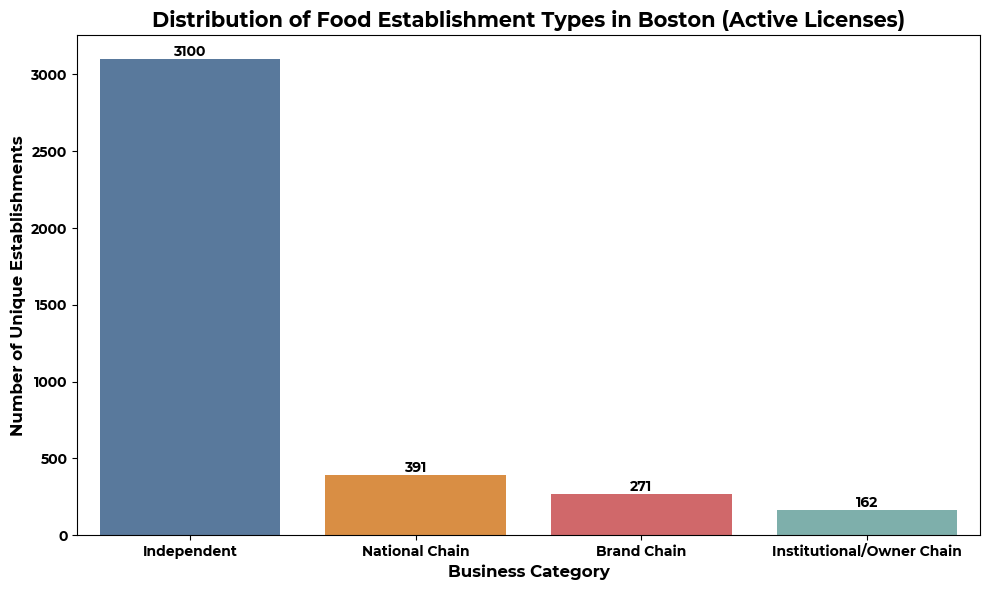

Saved!


In [8]:
# %%
# ============================================================
# VISUALIZATION
# ============================================================
# THis gives the unique establishment counts
group_counts = inspection.drop_duplicates(subset=['businessname_clean', 'address_clean'])['analysis_group'].value_counts()

plt.figure(figsize=(10, 6))
colors = ['#4e79a7', '#f28e2b', '#e15759', '#76b7b2']
sns.barplot(x=group_counts.index, y=group_counts.values, palette=colors)

plt.title('Distribution of Food Establishment Types in Boston (Active Licenses)', fontsize=15)
plt.ylabel('Number of Unique Establishments', fontsize=12)
plt.xlabel('Business Category', fontsize=12)

for i, v in enumerate(group_counts.values):
    plt.text(i, v + 20, str(v), ha='center', fontweight='bold')

plt.tight_layout()
plt.show()

# %%
# ============================================================
# SAVE
# ============================================================
inspection.to_csv('/Users/kamilalim/Desktop/Wellesley/Semester_8/DS_340H/Week8/boston_inspection_categorized.csv', index=False)
print("Saved!")

In [9]:
print(inspection['businessname_clean'].value_counts().head(10))

businessname_clean
dunkin donuts         8694
starbucks             2664
burger king           2156
subway                1893
caffe nero            1848
the real deal         1805
mcdonalds             1754
whole foods market    1705
dominos               1341
flames restaurant     1298
Name: count, dtype: int64


In [10]:
# %%
# ============================================================
# LOAD AND CLEAN CENSUS INCOME DATA
# ============================================================
import geopandas as gpd
from shapely.geometry import Point

# Load Census data and map each census tract to the longitude and latitude given in the inspections data

census = pd.read_csv('/Users/kamilalim/Desktop/Wellesley/Semester_8/DS_340H/Project/BostonFoodInspections/ACSST5Y2024/ACSST5Y2024.S1901-Data.csv', low_memory=False)

# Skip row 0 which contains column descriptions not data
census_clean = census.iloc[1:].copy()
census_clean = census_clean[['NAME', 'S1901_C01_012E']].rename(columns={
    'S1901_C01_012E': 'median_income'
})
census_clean['tract_num'] = census_clean['NAME'].str.extract(r'Census Tract ([\d.]+)')
census_clean['median_income'] = pd.to_numeric(census_clean['median_income'], errors='coerce')

print(f"Census tracts loaded: {len(census_clean)}")
print(f"Tracts with valid income: {census_clean['median_income'].notna().sum()}")

# Explore data
print("Shape:", census.shape)
print(census.info())
#print(census.columns.tolist())
#print(census.head(2))

print(census['NAME'].head(10))

# Check median income column - S1901_C01_012E
print(census[['NAME', 'S1901_C01_012E']].head(10))


Census tracts loaded: 235
Tracts with valid income: 214
Shape: (236, 131)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 236 entries, 0 to 235
Columns: 131 entries, GEO_ID to Unnamed: 130
dtypes: float64(1), object(130)
memory usage: 241.7+ KB
None
0                                Geographic Area Name
1    Census Tract 1.01; Suffolk County; Massachusetts
2    Census Tract 1.02; Suffolk County; Massachusetts
3    Census Tract 2.01; Suffolk County; Massachusetts
4    Census Tract 2.02; Suffolk County; Massachusetts
5    Census Tract 3.01; Suffolk County; Massachusetts
6    Census Tract 3.02; Suffolk County; Massachusetts
7    Census Tract 4.01; Suffolk County; Massachusetts
8    Census Tract 4.02; Suffolk County; Massachusetts
9    Census Tract 5.02; Suffolk County; Massachusetts
Name: NAME, dtype: object
                                               NAME  \
0                              Geographic Area Name   
1  Census Tract 1.01; Suffolk County; Massachusetts   
2  Census Tract 1

In [11]:
# %%
# ============================================================
# PARSE LAT/LONG FROM INSPECTION DATA
# ============================================================

##### PLAN
# Want to spatially join the longitude and latitude coorindates from the inspections datasetand census tract
    # boundaries. Make lat/long into points. Make census tracts into polygoins. Then each point falls into the polygons


def parse_location(loc):
    if pd.isna(loc): return None, None
    loc = str(loc).strip('()')
    parts = loc.split(',')
    if len(parts) == 2:
        return float(parts[0].strip()), float(parts[1].strip())
    return None, None

inspection[['lat', 'lon']] = inspection['location'].apply(
    lambda x: pd.Series(parse_location(x))
)
print(f"Inspections with valid coordinates: {inspection['lat'].notna().sum()}")


Inspections with valid coordinates: 406553


In [12]:
# %%
# ============================================================
# SPATIAL JOIN: MAP INSPECTIONS TO CENSUS TRACTS
# ============================================================

# Load Suffolk County census tract boundaries
tracts = gpd.read_file('/Users/kamilalim/Desktop/Wellesley/Semester_8/DS_340H/Project/BostonFoodInspections/tl_2023_25_tract/tl_2023_25_tract.shp')
tracts = tracts[tracts['COUNTYFP'] == '025'].to_crs('EPSG:4326')

# Convert inspections to GeoDataFrame
inspection_valid = inspection[inspection['lat'].notna()].copy()
geometry = [Point(lon, lat) for lat, lon in zip(inspection_valid['lat'], inspection_valid['lon'])]
inspection_geo = gpd.GeoDataFrame(inspection_valid, geometry=geometry, crs='EPSG:4326')

# Spatial join - each inspection point gets the tract it falls within
inspection_with_tract = gpd.sjoin(
    inspection_geo,
    tracts[['TRACTCE', 'NAMELSAD', 'geometry']],
    how='left',
    predicate='within'
)

In [13]:
# %%
# ============================================================
# MERGE MEDIAN INCOME ONTO INSPECTION DATA
# ============================================================

# Convert TRACTCE format e.g. "070104" -> "701.04", "030500" -> "305"
def format_tract_num(tractce):
    if pd.isna(tractce): return None
    num = str(int(tractce) / 100)
    if num.endswith('.0'):
        num = num[:-2]
    return num

inspection_with_tract['tract_num'] = inspection_with_tract['TRACTCE'].apply(
    lambda x: format_tract_num(x) if pd.notna(x) else None
)

inspection_final = inspection_with_tract.merge(
    census_clean[['tract_num', 'median_income']],
    on='tract_num',
    how='left'
)

print(f"Total rows: {len(inspection_final)}")
print(f"Rows with median income: {inspection_final['median_income'].notna().sum()} ({inspection_final['median_income'].notna().mean():.1%})")
print(inspection_final['median_income'].describe())


Total rows: 406553
Rows with median income: 394509 (97.0%)
count    394509.000000
mean     107373.713112
std       53083.475871
min       21250.000000
25%       70020.000000
50%      106573.000000
75%      144591.000000
max      243229.000000
Name: median_income, dtype: float64


In [14]:
# %%
# ============================================================
# SAVE FINAL DATASET
# ============================================================
inspection_final.to_csv(
    '/Users/kamilalim/Desktop/Wellesley/Semester_8/DS_340H/Project/boston_inspection_with_income.csv',
    index=False
)
print("Saved!")

Saved!


In [15]:
# %%
# ============================================================
# MAP: Income by Census Tract with Restaurant Points
# ============================================================

 ####################### NOT USING, not useful when static via python. look at interactive map.
# import contextily as ctx

# # Step 1: Prepare tract geometries with income data
# tracts_map = tracts.copy()
# tracts_map['tract_num'] = tracts_map['TRACTCE'].apply(
#     lambda x: format_tract_num(x) if pd.notna(x) else None
# )
# tracts_map = tracts_map.merge(census_clean[['tract_num', 'median_income']], on='tract_num', how='left')

# # Step 2: Get unique restaurant locations (one point per unique business+address)
# restaurants = inspection_final.drop_duplicates(subset=['businessname_clean', 'address_clean']).copy()
# restaurants = restaurants[restaurants['lat'].notna()]
# restaurant_geo = gpd.GeoDataFrame(
#     restaurants,
#     geometry=gpd.points_from_xy(restaurants['lon'], restaurants['lat']),
#     crs='EPSG:4326'
# )

# # Step 3: Plot
# fig, ax = plt.subplots(figsize=(14, 14))

# # Income choropleth base layer
# tracts_map.plot(
#     column='median_income',
#     ax=ax,
#     legend=True,
#     cmap='YlOrRd',
#     missing_kwds={'color': 'lightgrey', 'label': 'No data'},
#     legend_kwds={
#         'label': 'Median Household Income ($)',
#         'orientation': 'horizontal',
#         'shrink': 0.5,
#         'pad': 0.02
#     },
#     alpha=0.8
# )

# # Restaurant points on top, colored by business type
# colors = {
#     'National Chain': '#4e79a7',
#     'Brand Chain': '#f28e2b',
#     'Institutional/Owner Chain': '#e15759',
#     'Independent': '#76b7b2'
# }

# for group, color in colors.items():
#     subset = restaurant_geo[restaurant_geo['analysis_group'] == group]
#     subset.plot(ax=ax, color=color, markersize=3, alpha=0.6, label=group)

# ctx.add_basemap(
#     ax,
#     source=ctx.providers.CartoDB.Positron,  # clean light map with water
#     zoom=13
# )

# # Tract boundaries
# tracts_map.boundary.plot(ax=ax, linewidth=0.5, color='black', alpha=0.3)

# plt.title('Boston Food Establishments by Census Tract Income', fontsize=15)
# plt.legend(title='Business Type', loc='upper left', markerscale=3)
# ax.axis('off')
# plt.tight_layout()
# plt.show()

In [16]:
# %%
#!pip install folium
import folium
from folium.plugins import MarkerCluster
import json

# %%
# ============================================================
# INTERACTIVE MAP: Income by Census Tract + Restaurant Points
# ============================================================

# Step 1: Prepare tract data with income
tracts_map = tracts.copy()
tracts_map['tract_num'] = tracts_map['TRACTCE'].apply(
    lambda x: format_tract_num(x) if pd.notna(x) else None
)
tracts_map = tracts_map.merge(census_clean[['tract_num', 'median_income']], on='tract_num', how='left')
tracts_map = tracts_map.to_crs('EPSG:4326')

# Step 2: Get unique restaurant locations
restaurants = inspection_final.drop_duplicates(subset=['businessname_clean', 'address_clean'])[
    ['businessname_clean', 'address_clean', 'lat', 'lon', 'analysis_group']
].copy()
restaurants = restaurants[restaurants['lat'].notna()]

# Step 3: Create base map centered on Boston
m = folium.Map(
    location=[42.3601, -71.0589],
    zoom_start=12,
    tiles='CartoDB positron'  # clean light basemap, swap to 'OpenStreetMap' for more detail
)

# Step 4: Add income choropleth layer
folium.Choropleth(
    geo_data=tracts_map.__geo_interface__,
    name='Median Income',
    data=tracts_map[['tract_num', 'median_income']].dropna(),
    columns=['tract_num', 'median_income'],
    key_on='feature.properties.tract_num',
    fill_color='YlOrRd',
    fill_opacity=0.6,
    line_opacity=0.3,
    legend_name='Median Household Income ($)',
    nan_fill_color='lightgrey'
).add_to(m)

# Step 5: Add restaurant points colored by business type
colors = {
    'National Chain': 'blue',
    'Brand Chain': 'orange',
    'Institutional/Owner Chain': 'red',
    'Independent': 'green'
}

# Use feature groups so each type can be toggled on/off
for group, color in colors.items():
    feature_group = folium.FeatureGroup(name=group)
    subset = restaurants[restaurants['analysis_group'] == group]
    
    for _, row in subset.iterrows():
        folium.CircleMarker(
            location=[row['lat'], row['lon']],
            radius=4,
            color=color,
            fill=True,
            fill_opacity=0.7,
            popup=folium.Popup(
                f"<b>{row['businessname_clean']}</b><br>{row['analysis_group']}<br>{row['address_clean']}",
                max_width=200
            )
        ).add_to(feature_group)
    
    feature_group.add_to(m)

# Step 6: Add layer control to toggle layers on/off
folium.LayerControl().add_to(m)

# Step 7: Save and display
m.save('/Users/kamilalim/Desktop/Wellesley/Semester_8/DS_340H/Project/boston_restaurants_map.html')
print("Map saved! Open the HTML file in your browser.")

# Display inline in Jupyter
m

Map saved! Open the HTML file in your browser.


In [17]:
# ============================================================
# PARSE DATES & FILTER TO 2024–2026
# ============================================================
date_col = 'violdttm'
inspection_final[date_col] = pd.to_datetime(inspection_final[date_col], errors='coerce', utc=True)

df_filtered = inspection_final[
    (inspection_final[date_col].dt.year >= 2024) &
    (inspection_final[date_col].dt.year <= 2026)
].copy()

print(f"Rows with violdttm in 2024-2026: {len(df_filtered)}")
print(df_filtered['result'].value_counts())


Rows with violdttm in 2024-2026: 78242
result
HE_Fail       34950
HE_Pass       23905
HE_FailExt    11489
HE_Filed       4425
HE_Hearing     2099
HE_VolClos     1019
HE_TSOP         283
HE_NotReq        61
HE_OutBus         6
HE_Closure        4
HE_FAILNOR        1
Name: count, dtype: int64


In [18]:
# ============================================================
# FLOOR VIOLDTTM TO DATE (so violations from same visit group correctly)
# ============================================================
df_filtered['visit_date'] = df_filtered['violdttm'].dt.date


In [19]:
# %%
# ============================================================
# COMPUTE VIOLATIONS PER VISIT
# ============================================================
visit_keys = ['businessname_clean', 'address_clean', 'visit_date']

violations_per_visit = (
    df_filtered
    .groupby(visit_keys)
    .size()
    .reset_index(name='violations_this_visit')
)

visit_df = df_filtered.drop_duplicates(subset=visit_keys).copy()
visit_df = visit_df.merge(violations_per_visit, on=visit_keys, how='left')

print(f"\nUnique visits (inspections): {len(visit_df)}")
print(visit_df['violations_this_visit'].describe())
print(f"\nResult distribution across visits:")
print(visit_df['result'].value_counts())



Unique visits (inspections): 17714
count    17714.000000
mean         4.416958
std          3.701429
min          1.000000
25%          2.000000
50%          3.000000
75%          6.000000
max         64.000000
Name: violations_this_visit, dtype: float64

Result distribution across visits:
result
HE_Fail       7062
HE_Pass       6508
HE_FailExt    2054
HE_Filed      1538
HE_Hearing     356
HE_VolClos     161
HE_TSOP         21
HE_NotReq       10
HE_Closure       2
HE_OutBus        1
HE_FAILNOR       1
Name: count, dtype: int64


In [20]:
# Save pre-income-filter visit data for missingness investigation
visit_df_all = visit_df.copy()
print(f"Total visits before income filter: {len(visit_df_all)}")
print(f"Missing median_income: {visit_df_all['median_income'].isna().sum()}")
print(f"Missing tract_num: {visit_df_all['tract_num'].isna().sum()}")

Total visits before income filter: 17714
Missing median_income: 634
Missing tract_num: 0


In [21]:
# %%
# ============================================================
# MERGE INCOME QUARTILE ONTO VISIT-LEVEL DATA
# ============================================================
visit_df = visit_df[visit_df['median_income'].notna()].copy()
visit_df['income_quartile'] = pd.qcut(
    visit_df['median_income'],
    q=4,
    labels=['Q1 (Low)', 'Q2', 'Q3', 'Q4 (High)']
)
print(f"\nVisits with income data: {len(visit_df)}")
print(visit_df['income_quartile'].value_counts())


Visits with income data: 17080
income_quartile
Q2           4375
Q1 (Low)     4276
Q4 (High)    4251
Q3           4178
Name: count, dtype: int64


In [22]:
# %%
# ============================================================
# CHAIN-LEVEL AGGREGATION
# ============================================================
chain_visits = visit_df[visit_df['analysis_group'] == 'National Chain'].copy()

# Aggregate by chain x census tract
chain_tract = (
    chain_visits
    .groupby(['businessname_clean', 'tract_num', 'median_income', 'income_quartile'])
    .agg(
        total_visits=('violations_this_visit', 'count'),
        mean_violations_per_visit=('violations_this_visit', 'mean'),
        median_violations_per_visit=('violations_this_visit', 'median'),
        total_violations=('violations_this_visit', 'sum')
    )
    .reset_index()
)

# Summary by chain across all tracts (min 5 visits for reliability)
chain_summary = (
    chain_visits
    .groupby('businessname_clean')
    .agg(
        total_visits=('violations_this_visit', 'count'),
        mean_violations_per_visit=('violations_this_visit', 'mean'),
        total_violations=('violations_this_visit', 'sum')
    )
    .reset_index()
    .sort_values('mean_violations_per_visit', ascending=False)
)
chain_summary = chain_summary[chain_summary['total_visits'] >= 5]
print(f"\nChains with 5+ visits: {len(chain_summary)}")
print(chain_summary)

/var/folders/6_/l68l87gx1dlg999n_t092b7w0000gn/T/ipykernel_90662/649669393.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(['businessname_clean', 'tract_num', 'median_income', 'income_quartile'])



Chains with 5+ visits: 44
        businessname_clean  total_visits  mean_violations_per_visit  \
0                applebees             7                   5.000000   
34  potbelly sandwich shop             9                   4.888889   
1                  bartaco            14                   4.857143   
41                  subway            97                   4.536082   
7               caffe nero           107                   4.495327   
48             wahlburgers             9                   4.222222   
18                  gopuff            16                   4.125000   
51                wingstop            14                   4.000000   
37           raising canes            10                   3.800000   
49                  wendys            24                   3.791667   
25         legal sea foods            35                   3.742857   
33                 popeyes            28                   3.464286   
17                gong cha            43          

In [23]:
print(chain_summary['businessname_clean'].sort_values().to_string())

0                  applebees
1                    bartaco
2                 ben jerrys
3        blank street coffee
4                blaze pizza
5         blue bottle coffee
6                burger king
7                 caffe nero
8                       cava
9                  chickfila
11    chipotle mexican grill
12         daves hot chicken
13                   dominos
14             dunkin donuts
15                 five guys
17                  gong cha
18                    gopuff
19                 honeygrow
20          insomnia cookies
21              jersey mikes
23                just salad
24                       kfc
25           legal sea foods
26             lukes lobster
27                 mcdonalds
29                otto pizza
30              panera bread
31                papa johns
32               playa bowls
33                   popeyes
34    potbelly sandwich shop
37             raising canes
38               shake shack
39                 starbucks
41            

   income_quartile             analysis_group  mean_vpv  n_visits
0         Q1 (Low)                Brand Chain  6.085919       419
1         Q1 (Low)                Independent  4.917560      3360
2         Q1 (Low)  Institutional/Owner Chain  4.548387       124
3         Q1 (Low)             National Chain  3.737265       373
4               Q2                Brand Chain  4.380665       331
5               Q2                Independent  4.714124      3526
6               Q2  Institutional/Owner Chain  3.675258       194
7               Q2             National Chain  2.774691       324
8               Q3                Brand Chain  3.996491       285
9               Q3                Independent  4.392911      3301
10              Q3  Institutional/Owner Chain  5.254386       114
11              Q3             National Chain  2.807531       478
12       Q4 (High)                Brand Chain  3.917738       389
13       Q4 (High)                Independent  4.412160      3125
14       Q

/Users/kamilalim/anaconda3/lib/python3.10/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


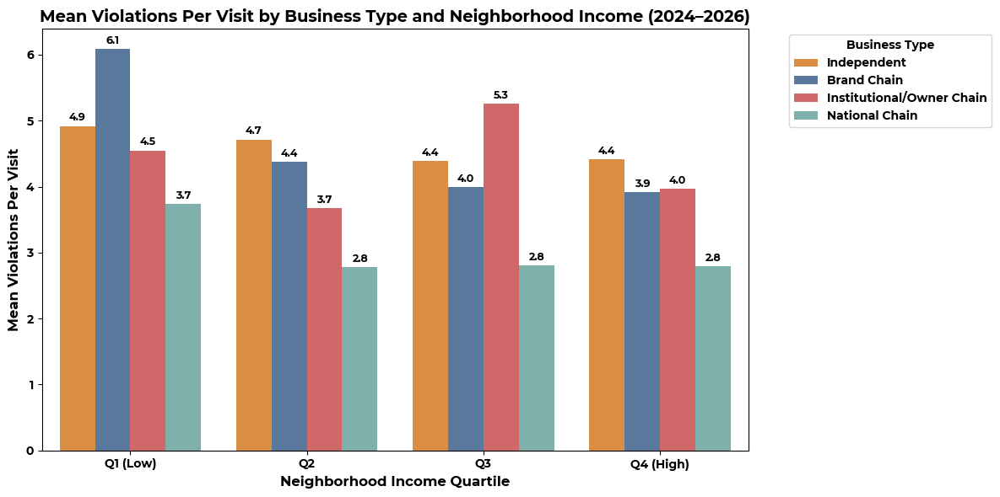

In [24]:
# ============================================================
# STATIC VISUALIZATION: Mean Violations Per Visit
# by Business Type and Income Quartile
# ============================================================
# Aggregate mean violations per visit by analysis_group and income_quartile
grouped = (
    visit_df[visit_df['income_quartile'].notna()]
    .groupby(['income_quartile', 'analysis_group'], observed = True)
    .agg(
        mean_vpv=('violations_this_visit', 'mean'),
        n_visits=('violations_this_visit', 'count')
    )
    .reset_index()
)

print(grouped.to_string())

fig, ax = plt.subplots(figsize=(12, 6))

sns.barplot(
    data=grouped,
    x='income_quartile',
    y='mean_vpv',
    hue='analysis_group',
    hue_order=['Independent', 'Brand Chain', 'Institutional/Owner Chain', 'National Chain'],
    palette=['#f28e2b', '#4e79a7', '#e15759', '#76b7b2'],
    order=['Q1 (Low)', 'Q2', 'Q3', 'Q4 (High)'],
    ax=ax
)

ax.set_title(
    'Mean Violations Per Visit by Business Type and Neighborhood Income (2024–2026)',
    fontsize=14
)
ax.set_xlabel('Neighborhood Income Quartile', fontsize=12)
ax.set_ylabel('Mean Violations Per Visit', fontsize=12)
ax.legend(title='Business Type', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add value labels on bars
for container in ax.containers:
    ax.bar_label(container, fmt='%.1f', padding=3, fontsize=9)

plt.tight_layout()
plt.savefig(
    '/Users/kamilalim/Desktop/Wellesley/Semester_8/DS_340H/Project/violations_by_type_and_income.png',
    dpi=150, bbox_inches='tight'
)
plt.show()

In [25]:
visit_df.to_csv(
    '/Users/kamilalim/Desktop/Wellesley/Semester_8/DS_340H/Project/boston_visit_df.csv',
    index=False
)
print("Saved boston_visit_df!")

Saved boston_visit_df!


In [26]:
# Now move to R for the mixed effect model since we want to use the lme4 package

In [27]:
# ============================================================
# INVESTIGATE MISSING VALUES
# ============================================================

# Start from the full filtered dataset before income filter
print("=== BEFORE income filter ===")
print(f"Total visits in df_filtered (visit-level): {len(visit_df_all)}")

# How many are missing income?
missing_income = visit_df[visit_df['median_income'].isna()]
print(f"\nVisits missing median_income: {len(missing_income)}")
print(f"That's {len(missing_income)/len(visit_df)*100:.1f}% of visits")

# Which tracts are missing income?
print(f"\nTracts missing income:")
print(missing_income['tract_num'].value_counts())

# Are they missing tract entirely (fell outside boundaries)?
missing_tract = visit_df[visit_df['tract_num'].isna()]
print(f"\nVisits missing tract_num (outside boundaries): {len(missing_tract)}")
print(f"Business types for out-of-boundary visits:")
print(missing_tract['analysis_group'].value_counts())

# Is missingness random across business types?
print(f"\nMissing income by business type:")
print(visit_df.groupby('analysis_group')['median_income'].apply(
    lambda x: x.isna().sum()
).rename('missing_count'))

# Is missingness random across neighborhoods?
print(f"\nMissing income by zip code:")
print(missing_income['zip'].value_counts().head(10))

# Property IDs missing (874 flagged in R)
print(f"\nMissing property_id: {visit_df['property_id'].isna().sum()}")
print(f"Do missing property_ids correlate with missing income?")
print(pd.crosstab(
    visit_df['property_id'].isna(), 
    visit_df['median_income'].isna(),
    rownames=['missing_property_id'],
    colnames=['missing_income']
))

=== BEFORE income filter ===
Total visits in df_filtered (visit-level): 17714

Visits missing median_income: 0
That's 0.0% of visits

Tracts missing income:
Series([], Name: count, dtype: int64)

Visits missing tract_num (outside boundaries): 0
Business types for out-of-boundary visits:
Series([], Name: count, dtype: int64)

Missing income by business type:
analysis_group
Brand Chain                  0
Independent                  0
Institutional/Owner Chain    0
National Chain               0
Name: missing_count, dtype: int64

Missing income by zip code:
Series([], Name: count, dtype: int64)

Missing property_id: 874
Do missing property_ids correlate with missing income?
missing_income       False
missing_property_id       
False                16206
True                   874


In [28]:
# ============================================================
# TRACE OBSERVATION DROPOUT ACROSS PIPELINE STAGES
# ============================================================

# Stage 1: Original dataset
print("=== STAGE 1: Original inspection dataset ===")
print(f"Total rows: {len(inspection)}")
print(f"Unique establishments: {inspection.drop_duplicates(['businessname_clean', 'address_clean']).shape[0]}")

# Stage 2: After date filter
print("\n=== STAGE 2: After 2024-2026 violdttm filter ===")
print(f"Total rows: {len(df_filtered)}")
print(f"Rows dropped: {len(inspection) - len(df_filtered)}")
print(f"Rows dropped because violdttm null: {inspection['violdttm'].isna().sum()}")
print(f"Rows dropped because outside 2024-2026: {inspection['violdttm'].notna().sum() - len(df_filtered)}")

# Stage 3: After spatial join (inspection_with_tract)
print("\n=== STAGE 3: After spatial join ===")
print(f"Total rows: {len(inspection_with_tract)}")
print(f"Rows missing tract (outside boundaries): {inspection_with_tract['TRACTCE'].isna().sum()}")

# Stage 4: After income merge (inspection_final)
print("\n=== STAGE 4: After income merge (inspection_final) ===")
print(f"Total rows: {len(inspection_final)}")
print(f"Rows missing median_income: {inspection_final['median_income'].isna().sum()}")
print(f"Tracts missing income: {inspection_final[inspection_final['median_income'].isna()]['tract_num'].nunique()}")

# Stage 5: After visit deduplication
print("\n=== STAGE 5: After visit deduplication (visit_df) ===")
print(f"Unique visits: {len(visit_df)}")

# Stage 6: After income quartile filter
print("\n=== STAGE 6: After income quartile filter (model dataset) ===")
model_data = visit_df[visit_df['median_income'].notna()]
print(f"Visits with income data: {len(model_data)}")
print(f"Visits dropped: {len(visit_df) - len(model_data)}")

# Summary
print("\n=== DROPOUT SUMMARY ===")
print(f"Started with:          {len(inspection):>8,} violation rows")
print(f"After date filter:     {len(df_filtered):>8,} rows ({len(inspection)-len(df_filtered):,} dropped)")
print(f"After visit collapse:  {len(visit_df):>8,} visits")
print(f"Final model dataset:   {len(model_data):>8,} visits ({len(visit_df)-len(model_data):,} dropped)")

=== STAGE 1: Original inspection dataset ===
Total rows: 433894
Unique establishments: 3924

=== STAGE 2: After 2024-2026 violdttm filter ===
Total rows: 78242
Rows dropped: 355652
Rows dropped because violdttm null: 28212
Rows dropped because outside 2024-2026: 327440

=== STAGE 3: After spatial join ===
Total rows: 406553
Rows missing tract (outside boundaries): 0

=== STAGE 4: After income merge (inspection_final) ===
Total rows: 406553
Rows missing median_income: 12044
Tracts missing income: 13

=== STAGE 5: After visit deduplication (visit_df) ===
Unique visits: 17080

=== STAGE 6: After income quartile filter (model dataset) ===
Visits with income data: 17080
Visits dropped: 0

=== DROPOUT SUMMARY ===
Started with:           433,894 violation rows
After date filter:       78,242 rows (355,652 dropped)
After visit collapse:    17,080 visits
Final model dataset:     17,080 visits (0 dropped)


In [29]:
####### STAGE 3 dropped rows investigation
# Check what happened to the 27k dropped rows
print(f"Original rows: {len(inspection)}")
print(f"Rows with valid coordinates: {inspection['lat'].notna().sum()}")
print(f"Rows with null coordinates: {inspection['lat'].isna().sum()}")

# Of those with valid coordinates, how many got a tract assignment?
print(f"\nAfter spatial join:")
print(f"Rows with tract assigned: {inspection_with_tract['TRACTCE'].notna().sum()}")
print(f"Rows without tract (outside boundaries): {inspection_with_tract['TRACTCE'].isna().sum()}")

# Where are the unmatched ones?
unmatched = inspection_with_tract[inspection_with_tract['TRACTCE'].isna()]
print(f"\nUnmatched rows by zip code:")
print(unmatched['zip'].value_counts().head(10))
print(f"\nSample unmatched coordinates:")
print(unmatched[['businessname', 'address', 'lat', 'lon']].head(10))

Original rows: 433894
Rows with valid coordinates: 406553
Rows with null coordinates: 27341

After spatial join:
Rows with tract assigned: 406553
Rows without tract (outside boundaries): 0

Unmatched rows by zip code:
Series([], Name: count, dtype: int64)

Sample unmatched coordinates:
Empty DataFrame
Columns: [businessname, address, lat, lon]
Index: []


In [30]:
# Which 13 tracts are missing income?
missing_tract_income = (
    inspection_final[inspection_final['median_income'].isna()]
    .groupby(['tract_num', 'NAMELSAD'])
    .agg(
        violation_rows=('businessname_clean', 'count'),
        unique_establishments=('businessname_clean', 'nunique'),
        business_types=('analysis_group', lambda x: x.value_counts().to_dict())
    )
    .reset_index()
    .sort_values('violation_rows', ascending=False)
)
print(missing_tract_income.to_string())

   tract_num              NAMELSAD  violation_rows  unique_establishments                                                                                     business_types
1    1201.03  Census Tract 1201.03            3030                     15  {'Independent': 1909, 'Brand Chain': 529, 'National Chain': 503, 'Institutional/Owner Chain': 89}
8       9813     Census Tract 9813            2546                     98                                   {'Independent': 1727, 'National Chain': 602, 'Brand Chain': 217}
0     101.03   Census Tract 101.03            2535                     23  {'Independent': 2042, 'Institutional/Owner Chain': 320, 'National Chain': 136, 'Brand Chain': 37}
2     612.03   Census Tract 612.03            2171                     16                                                         {'Independent': 2168, 'National Chain': 3}
7    9812.02  Census Tract 9812.02            1071                     15                                                           {'I

In [31]:
# Check how these tract numbers appear in census_clean
print(census_clean[census_clean['tract_num'].isin(['1201.03', '101.03', '612.03', '8.07'])])

# Check what the raw NAME looks like for these tracts
print(census_clean[census_clean['NAME'].str.contains('1201|101.03|612|8.07', na=False)].head(10))

# Check how format_tract_num is converting these
for tractce in ['120103', '010300', '061203', '000807']:
    print(f"{tractce} -> {format_tract_num(tractce)}")

### Census tracts excluded are special purpose tracts (98xx) or don't have ACS median income data

                                                  NAME  median_income  \
22    Census Tract 8.07; Suffolk County; Massachusetts            NaN   
23   Census Tract 101.03; Suffolk County; Massachus...            NaN   
83   Census Tract 612.03; Suffolk County; Massachus...            NaN   
170  Census Tract 1201.03; Suffolk County; Massachu...            NaN   

    tract_num  
22       8.07  
23     101.03  
83     612.03  
170   1201.03  
                                                  NAME  median_income  \
22    Census Tract 8.07; Suffolk County; Massachusetts            NaN   
23   Census Tract 101.03; Suffolk County; Massachus...            NaN   
81   Census Tract 612.01; Suffolk County; Massachus...       128125.0   
82   Census Tract 612.02; Suffolk County; Massachus...            NaN   
83   Census Tract 612.03; Suffolk County; Massachus...            NaN   
84   Census Tract 612.04; Suffolk County; Massachus...       171365.0   
170  Census Tract 1201.03; Suffolk County; 

In [32]:
# ============================================================
# INTERACTIVE MAP: Income by Census Tract + Restaurant Points
# Sized by mean violations per visit, colored by business type
# ============================================================

# Step 1: Aggregate to establishment level
# We need one row per physical location for the map
# showing their mean violations per visit across 2024-2026
establishment_map = (
    visit_df
    .groupby(['businessname_clean', 'address_clean', 'analysis_group', 'lat', 'lon'])
    .agg(
        mean_violations_per_visit=('violations_this_visit', 'mean'),
        total_visits=('violations_this_visit', 'count'),
        total_violations=('violations_this_visit', 'sum'),
        tract_num=('tract_num', 'first'),
        median_income=('median_income', 'first')
    )
    .reset_index()
)
establishment_map = establishment_map[establishment_map['lat'].notna()].copy()
print(f"Establishments on map: {len(establishment_map)}")
print(f"Mean violations per visit range: {establishment_map['mean_violations_per_visit'].min():.1f} - {establishment_map['mean_violations_per_visit'].max():.1f}")

# Step 2: Prepare tract boundaries with income
tracts_map = tracts.copy()
tracts_map['tract_num'] = tracts_map['TRACTCE'].apply(
    lambda x: format_tract_num(x) if pd.notna(x) else None
)
tracts_map = tracts_map.merge(
    census_clean[['tract_num', 'median_income']], 
    on='tract_num', 
    how='left'
)
tracts_map = tracts_map.to_crs('EPSG:4326')

# Step 3: Create base map centered on Boston
m = folium.Map(
    location=[42.3601, -71.0589],
    zoom_start=12,
    tiles='CartoDB positron'
)

# Step 4: Add income choropleth layer
# Yellow = lower income, Red = higher income
folium.Choropleth(
    geo_data=tracts_map.__geo_interface__,
    name='Median Household Income',
    data=tracts_map[['tract_num', 'median_income']].dropna(),
    columns=['tract_num', 'median_income'],
    key_on='feature.properties.tract_num',
    fill_color='YlOrRd',
    fill_opacity=0.5,
    line_opacity=0.2,
    legend_name='Median Household Income ($)',
    nan_fill_color='lightgrey'
).add_to(m)

# Step 5: Add restaurant points
# Color encodes business type
# Size encodes mean violations per visit
# Larger circle = more violations on average

colors = {
    'National Chain': 'blue',
    'Brand Chain': 'orange',
    'Institutional/Owner Chain': 'red',
    'Independent': 'green'
}

# Compute min/max for scaling circle size
min_vpv = establishment_map['mean_violations_per_visit'].min()
max_vpv = establishment_map['mean_violations_per_visit'].max()

for group, color in colors.items():
    feature_group = folium.FeatureGroup(name=f"{group} (n={establishment_map[establishment_map['analysis_group']==group].shape[0]})")
    subset = establishment_map[establishment_map['analysis_group'] == group]

    for _, row in subset.iterrows():
        # Scale radius between 3 and 14 based on mean violations per visit
        # This keeps circles readable at the map zoom level
        radius = 3 + ((row['mean_violations_per_visit'] - min_vpv) / (max_vpv - min_vpv)) * 11

        folium.CircleMarker(
            location=[row['lat'], row['lon']],
            radius=radius,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.6,
            weight=1,
            popup=folium.Popup(
                f"""
                <b>{row['businessname_clean'].title()}</b><br>
                <b>Type:</b> {row['analysis_group']}<br>
                <b>Address:</b> {row['address_clean']}<br>
                <b>Census Tract:</b> {row['tract_num']}<br>
                <b>Tract Median Income:</b> ${row['median_income']:,.0f}<br>
                <hr>
                <b>Mean violations/visit:</b> {row['mean_violations_per_visit']:.1f}<br>
                <b>Total visits:</b> {row['total_visits']}<br>
                <b>Total violations:</b> {row['total_violations']:.0f}
                """,
                max_width=250
            ),
            tooltip=f"{row['businessname_clean'].title()} — {row['mean_violations_per_visit']:.1f} violations/visit"
        ).add_to(feature_group)

    feature_group.add_to(m)

# Step 6: Add a legend for circle size
# Since folium doesn't have a built-in size legend,
# we add a custom HTML legend explaining the encoding
legend_html = """
<div style="position: fixed; bottom: 50px; left: 50px; z-index: 1000;
            background-color: white; padding: 12px; border-radius: 8px;
            border: 1px solid grey; font-size: 12px; line-height: 1.6;">
    <b>Circle Size = Mean Violations/Visit</b><br>
    <span style="font-size:8px">●</span> Small = fewer violations<br>
    <span style="font-size:14px">●</span> Large = more violations<br>
    <br>
    <b>Circle Color = Business Type</b><br>
    <span style="color:blue">●</span> National Chain<br>
    <span style="color:orange">●</span> Brand Chain<br>
    <span style="color:red">●</span> Institutional/Owner Chain<br>
    <span style="color:green">●</span> Independent<br>
    <br>
    <b>Tract Color = Median Income</b><br>
    <span style="color:#ffffb2">■</span> Lower income<br>
    <span style="color:#bd0026">■</span> Higher income
</div>
"""
m.get_root().html.add_child(folium.Element(legend_html))

# Step 7: Add layer control so users can toggle business types on/off
folium.LayerControl(collapsed=False).add_to(m)

# Step 8: Save and display
m.save('/Users/kamilalim/Desktop/Wellesley/Semester_8/DS_340H/Project/boston_restaurants_map_updated.html')
print("Map saved!")
m

Establishments on map: 2848
Mean violations per visit range: 1.0 - 23.8
Map saved!


     income_decile             analysis_group  mean_vpv  n_visits
0     D1\n(Lowest)                Brand Chain  5.397260       219
1     D1\n(Lowest)                Independent  5.065689      1705
2     D1\n(Lowest)  Institutional/Owner Chain  4.690476        84
3     D1\n(Lowest)             National Chain  3.482412       199
4               D2                Brand Chain  7.305389       167
5               D2                Independent  5.325160       938
6               D2  Institutional/Owner Chain  5.000000        30
7               D2             National Chain  4.790698       129
8               D3                Brand Chain  3.986842        76
9               D3                Independent  4.674541      1524
10              D3  Institutional/Owner Chain  4.854167        48
11              D3             National Chain  2.725664       113
12              D4                Brand Chain  4.131429       175
13              D4                Independent  4.963040      1434
14        

/Users/kamilalim/anaconda3/lib/python3.10/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


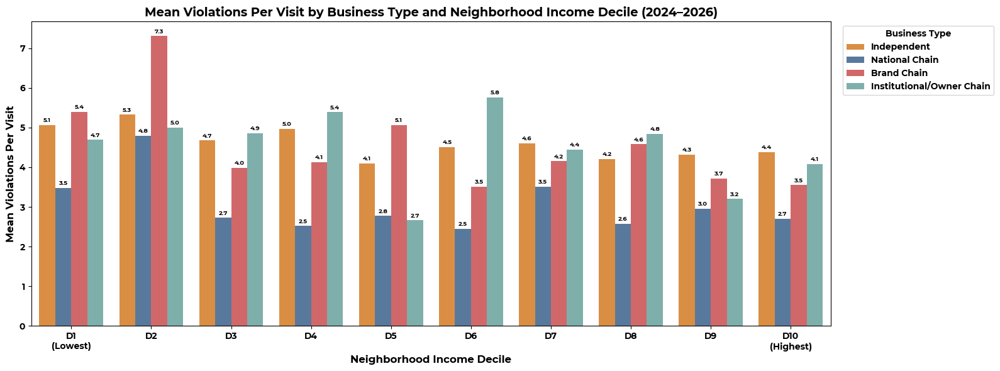

In [33]:
# Update visualization 2
# ============================================================
# VISUALIZATION 1: Mean Violations Per Visit by Business Type
# and Income DECILE (updated from quartile)
# ============================================================

# First add income decile to visit_df
visit_df['income_decile'] = pd.qcut(
    visit_df['median_income'],
    q=10,
    labels=['D1\n(Lowest)', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10\n(Highest)']
)

# Aggregate by decile and business type
grouped_decile = (
    visit_df[visit_df['income_decile'].notna()]
    .groupby(['income_decile', 'analysis_group'], observed=True)
    .agg(
        mean_vpv=('violations_this_visit', 'mean'),
        n_visits=('violations_this_visit', 'count')
    )
    .reset_index()
)
print(grouped_decile.to_string())

fig, ax = plt.subplots(figsize=(16, 6))
sns.barplot(
    data=grouped_decile,
    x='income_decile',
    y='mean_vpv',
    hue='analysis_group',
    hue_order=['Independent', 'National Chain', 'Brand Chain', 'Institutional/Owner Chain'],
    palette=['#f28e2b', '#4e79a7', '#e15759', '#76b7b2'],
    order=['D1\n(Lowest)', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10\n(Highest)'],
    ax=ax
)
ax.set_title(
    'Mean Violations Per Visit by Business Type and Neighborhood Income Decile (2024–2026)',
    fontsize=14
)
ax.set_xlabel('Neighborhood Income Decile', fontsize=12)
ax.set_ylabel('Mean Violations Per Visit', fontsize=12)
ax.legend(title='Business Type', bbox_to_anchor=(1.01, 1), loc='upper left')

# Add value labels — smaller font since there are more bars now
for container in ax.containers:
    ax.bar_label(container, fmt='%.1f', padding=2, fontsize=7)

plt.tight_layout()
plt.savefig(
    '/Users/kamilalim/Desktop/Wellesley/Semester_8/DS_340H/Project/violations_by_type_and_income_decile.png',
    dpi=150, bbox_inches='tight'
)
plt.show()

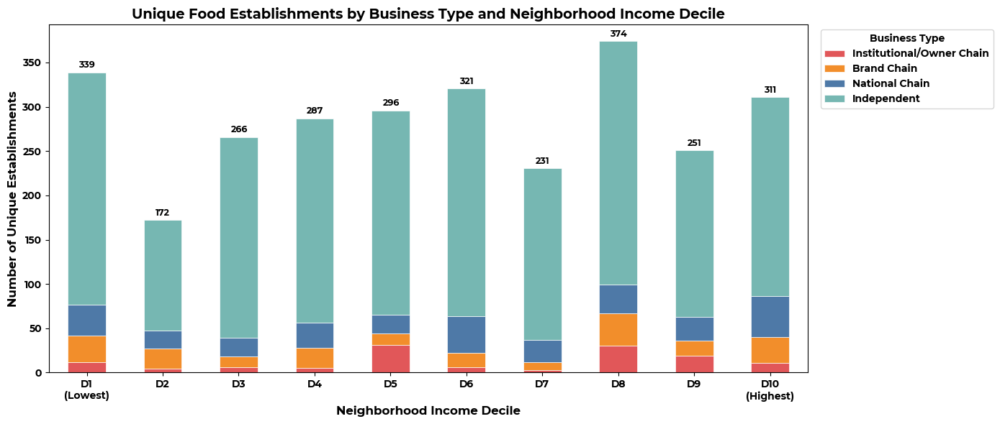

In [34]:
# Update visualization 1
# ============================================================
# VISUALIZATION 2: Stacked Bar Chart — Unique Establishments
# by Business Type across Income Deciles
# ============================================================

# We need establishment-level data (one row per unique location)
# merged with income decile
# Use visit_df aggregated to establishment level to get their decile

establishment_decile = (
    visit_df
    .drop_duplicates(subset=['businessname_clean', 'address_clean'])
    [['businessname_clean', 'address_clean', 'analysis_group', 
      'median_income', 'income_decile']]
    .dropna(subset=['income_decile'])
    .copy()
)

# Count unique establishments per decile and business type
stacked_counts = (
    establishment_decile
    .groupby(['income_decile', 'analysis_group'], observed=True)
    .size()
    .reset_index(name='n_establishments')
)

# Pivot to wide format for stacked bar
stacked_pivot = stacked_counts.pivot(
    index='income_decile',
    columns='analysis_group',
    values='n_establishments'
).fillna(0)

# Reorder columns so Independent is first (reference group)
col_order = ['Independent', 'National Chain', 'Brand Chain', 'Institutional/Owner Chain']
col_order = ['Institutional/Owner Chain', 'Brand Chain', 'National Chain', 'Independent']
stacked_pivot = stacked_pivot[col_order]

# Reorder rows by decile
decile_order = ['D1\n(Lowest)', 'D2', 'D3', 'D4', 'D5', 
                'D6', 'D7', 'D8', 'D9', 'D10\n(Highest)']
stacked_pivot = stacked_pivot.reindex(decile_order)

# Plot
fig, ax = plt.subplots(figsize=(14, 6))
colors = ['#e15759', '#f28e2b', '#4e79a7', '#76b7b2']

stacked_pivot.plot(
    kind='bar',
    stacked=True,
    color=colors,
    ax=ax,
    edgecolor='white',
    linewidth=0.5
)

ax.set_title(
    'Unique Food Establishments by Business Type and Neighborhood Income Decile',
    fontsize=14
)
ax.set_xlabel('Neighborhood Income Decile', fontsize=12)
ax.set_ylabel('Number of Unique Establishments', fontsize=12)
ax.legend(
    title='Business Type',
    bbox_to_anchor=(1.01, 1),
    loc='upper left'
)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

# Add total count labels on top of each bar
totals = stacked_pivot.sum(axis=1)
for i, total in enumerate(totals):
    ax.text(i, total + 5, str(int(total)), ha='center', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.savefig(
    '/Users/kamilalim/Desktop/Wellesley/Semester_8/DS_340H/Project/establishments_by_type_and_income_decile.png',
    dpi=150, bbox_inches='tight'
)
plt.show()

In [35]:
# Choose 5 major neighborhoods 
# ============================================================
# IDENTIFY CANDIDATE TRACTS FOR CASE STUDIES
# ============================================================
tract_candidates = (
    visit_df
    .groupby(['tract_num', 'NAMELSAD'])
    .agg(
        median_income=('median_income', 'first'),
        total_visits=('violations_this_visit', 'count'),
        total_establishments=('businessname_clean', 'nunique'),  # proxy for establishments
        n_national_chain=('analysis_group', lambda x: (x == 'National Chain').sum()),
        n_brand_chain=('analysis_group', lambda x: (x == 'Brand Chain').sum()),
        n_independent=('analysis_group', lambda x: (x == 'Independent').sum()),
        mean_vpv=('violations_this_visit', 'mean'),
    )
    .reset_index()
    .sort_values('median_income')
)

tract_candidates = tract_candidates[tract_candidates['total_visits'] >= 20]

print(f"Tracts with 20+ visits: {len(tract_candidates)}")
print("\n--- LOWEST INCOME TRACTS ---")
print(tract_candidates.head(10).to_string())
print("\n--- HIGHEST INCOME TRACTS ---")
print(tract_candidates.tail(10).to_string())
print("\n--- MIDDLE INCOME TRACTS ---")
mid = tract_candidates.iloc[len(tract_candidates)//2 - 5 : len(tract_candidates)//2 + 5]
print(mid.to_string())

Tracts with 20+ visits: 151

--- LOWEST INCOME TRACTS ---
    tract_num             NAMELSAD  median_income  total_visits  total_establishments  n_national_chain  n_brand_chain  n_independent  mean_vpv
144    806.01  Census Tract 806.01        21250.0           139                    22                29              6             97  3.215827
23     104.05  Census Tract 104.05        28125.0            59                    10                20              0             39  5.711864
22     104.04  Census Tract 104.04        28958.0           156                    24                36              6            100  5.826923
142    804.01  Census Tract 804.01        29375.0            79                    12                 0              0             79  4.493671
159       821     Census Tract 821        29719.0            55                     9                 0             19             36  4.509091
152    813.02  Census Tract 813.02        32441.0            27               

In [36]:
# ============================================================
# CASE STUDY: 5 SELECTED CENSUS TRACTS
# ============================================================
selected_tracts = ['104.04', '901', '8.04', '107.02', '701.04']
# 104.04 Low income, good mix of chain types
# 901: low income, mostly independents
# 8.04: Middle income, mix of chain types
# 107.02: High income, mostly chains
# 701.04: High income, large sample

# Manually map tract to Boston neighborhood
# Fill these in after confirming on a map
neighborhood_names = {
    '104.04': 'Roxbury',        # update if different
    '901':    'Dorchester',     # update if different
    '8.04':   'South End',      # update if different
    '107.02': 'Back Bay',       # update if different
    '701.04': 'Downtown'        # update if different
}

# Filter visit_df to selected tracts
case_df = visit_df[visit_df['tract_num'].isin(selected_tracts)].copy()

# ============================================================
# METRIC 1: Overview per tract
# ============================================================
overview = (
    case_df
    .groupby('tract_num')
    .agg(
        median_income=('median_income', 'first'),
        total_visits=('violations_this_visit', 'count'),
        total_violations=('violations_this_visit', 'sum'),
        mean_vpv=('violations_this_visit', 'mean'),
        unique_businesses=('businessname_clean', 'nunique')
    )
    .reset_index()
)
overview['neighborhood'] = overview['tract_num'].map(neighborhood_names)
overview = overview.sort_values('median_income')
overview['median_income'] = overview['median_income'].apply(lambda x: f"${x:,.0f}")
overview['mean_vpv'] = overview['mean_vpv'].round(2)

print("\n" + "="*80)
print("CASE STUDY OVERVIEW")
print("="*80)
print(overview[['neighborhood', 'tract_num', 'median_income', 
                'total_visits', 'unique_businesses', 
                'mean_vpv', 'total_violations']].to_string(index=False))

# ============================================================
# METRIC 2: Business type breakdown per tract
# ============================================================
print("\n" + "="*80)
print("ESTABLISHMENTS BY BUSINESS TYPE")
print("="*80)

biz_type = (
    case_df
    .groupby(['tract_num', 'analysis_group'])
    .agg(
        n_visits=('violations_this_visit', 'count'),
        mean_vpv=('violations_this_visit', 'mean'),
        unique_businesses=('businessname_clean', 'nunique')
    )
    .reset_index()
)
biz_type['neighborhood'] = biz_type['tract_num'].map(neighborhood_names)
biz_type['mean_vpv'] = biz_type['mean_vpv'].round(2)
biz_type = biz_type.sort_values(['median_income' if 'median_income' in biz_type.columns 
                                  else 'tract_num', 'analysis_group'])

for tract in selected_tracts:
    hood = neighborhood_names[tract]
    income = case_df[case_df['tract_num'] == tract]['median_income'].iloc[0]
    print(f"\n{hood} (Tract {tract}, Income: ${income:,.0f})")
    print("-"*50)
    subset = biz_type[biz_type['tract_num'] == tract][
        ['analysis_group', 'unique_businesses', 'n_visits', 'mean_vpv']
    ].rename(columns={
        'analysis_group': 'Business Type',
        'unique_businesses': 'Unique Businesses',
        'n_visits': 'Total Visits',
        'mean_vpv': 'Mean VPV'
    })
    print(subset.to_string(index=False))

# ============================================================
# METRIC 3: Pass/fail rate per tract and business type
# ============================================================
print("\n" + "="*80)
print("PASS/FAIL RATE BY TRACT")
print("="*80)

# Classify result into pass, fail, other
case_df['result_simple'] = case_df['result'].map({
    'HE_Pass': 'Pass',
    'Pass': 'Pass',
    'HE_Fail': 'Fail',
    'Fail': 'Fail',
    'HE_FailExt': 'Fail',
    'HE_FAILNOR': 'Fail'
}).fillna('Other')

pass_fail = (
    case_df
    .groupby(['tract_num', 'result_simple'])
    .size()
    .reset_index(name='n_visits')
)

pass_fail_pivot = pass_fail.pivot(
    index='tract_num',
    columns='result_simple',
    values='n_visits'
).fillna(0)

# Calculate pass rate
for col in ['Pass', 'Fail', 'Other']:
    if col not in pass_fail_pivot.columns:
        pass_fail_pivot[col] = 0

pass_fail_pivot['Total'] = pass_fail_pivot.sum(axis=1)
pass_fail_pivot['Pass Rate'] = (
    pass_fail_pivot['Pass'] / (pass_fail_pivot['Pass'] + pass_fail_pivot['Fail']) * 100
).round(1).astype(str) + '%'
pass_fail_pivot['neighborhood'] = pass_fail_pivot.index.map(neighborhood_names)

print(pass_fail_pivot[['neighborhood', 'Pass', 'Fail', 'Other', 'Total', 'Pass Rate']].to_string())

# ============================================================
# METRIC 4: Top violations per tract
# ============================================================
print("\n" + "="*80)
print("TOP 5 MOST COMMON VIOLATIONS PER TRACT")
print("="*80)

# For this we need to go back to df_filtered (violation-level data)
# since visit_df is already aggregated
case_violations = df_filtered[df_filtered['tract_num'].isin(selected_tracts)].copy()
case_violations['neighborhood'] = case_violations['tract_num'].map(neighborhood_names)

for tract in selected_tracts:
    hood = neighborhood_names[tract]
    income = case_df[case_df['tract_num'] == tract]['median_income'].iloc[0]
    print(f"\n{hood} (Tract {tract}, Income: ${income:,.0f})")
    print("-"*50)
    top_viols = (
        case_violations[case_violations['tract_num'] == tract]
        ['violdesc']
        .value_counts()
        .head(5)
        .reset_index()
    )
    top_viols.columns = ['Violation Description', 'Count']
    print(top_viols.to_string(index=False))


CASE STUDY OVERVIEW
neighborhood tract_num median_income  total_visits  unique_businesses  mean_vpv  total_violations
     Roxbury    104.04       $28,958           156                 24      5.83               909
  Dorchester       901       $32,451            91                 12      5.65               514
   South End      8.04       $98,239           127                 20      4.61               586
    Back Bay    107.02      $191,406           310                 46      3.74              1160
    Downtown    701.04      $235,950           624                132      3.63              2266

ESTABLISHMENTS BY BUSINESS TYPE

Roxbury (Tract 104.04, Income: $28,958)
--------------------------------------------------
            Business Type  Unique Businesses  Total Visits  Mean VPV
              Brand Chain                  1             6      5.33
              Independent                 15           100      6.82
Institutional/Owner Chain                  2            14 

In [37]:
# ============================================================
# IDENTIFY CANDIDATE BUSINESSES FOR CASE STUDIES
# ============================================================
business_candidates = (
    visit_df
    .groupby(['businessname_clean', 'address_clean', 'tract_num',
              'NAMELSAD', 'median_income', 'analysis_group'], observed=True)
    .agg(
        total_visits=('violations_this_visit', 'count'),
        mean_vpv=('violations_this_visit', 'mean'),
        total_violations=('violations_this_visit', 'sum'),
        pass_rate=('result', lambda x: (x.isin(['HE_Pass', 'Pass'])).mean() * 100),
    )
    .reset_index()
)

# Add income quartile back after aggregation
business_candidates['income_quartile'] = pd.qcut(
    business_candidates['median_income'],
    q=4,
    labels=['Q1 (Low)', 'Q2', 'Q3', 'Q4 (High)']
)

# Filter to businesses with at least 3 visits for reliability
business_candidates = business_candidates[business_candidates['total_visits'] >= 3]
business_candidates['mean_vpv'] = business_candidates['mean_vpv'].round(2)
business_candidates['pass_rate'] = business_candidates['pass_rate'].round(1)

# Show candidates by category
for group in ['National Chain', 'Brand Chain', 'Institutional/Owner Chain', 'Independent']:
    print(f"\n{'='*80}")
    print(f"{group.upper()} — sorted by income")
    print('='*80)
    subset = (
        business_candidates[business_candidates['analysis_group'] == group]
        .sort_values('median_income')
        [['businessname_clean', 'address_clean', 'tract_num',
          'median_income', 'income_quartile', 'total_visits',
          'mean_vpv', 'pass_rate']]
    )
    print("--- LOW INCOME ---")
    print(subset.head(5).to_string(index=False))
    print("--- HIGH INCOME ---")
    print(subset.tail(5).to_string(index=False))


NATIONAL CHAIN — sorted by income
--- LOW INCOME ---
businessname_clean        address_clean tract_num  median_income income_quartile  total_visits  mean_vpv  pass_rate
     dunkin donuts      1131 tremont st    806.01        21250.0        Q1 (Low)            11      3.64       45.5
     dunkin donuts   2360 washington st    806.01        21250.0        Q1 (Low)             8      2.75       37.5
     dunkin donuts   2489 washington st    806.01        21250.0        Q1 (Low)             8      3.25       37.5
            subway 393 massachusetts av    104.05        28125.0        Q1 (Low)            14      6.50       42.9
     dunkin donuts       115 forsyth st    104.05        28125.0        Q1 (Low)             6      7.00       16.7
--- HIGH INCOME ---
businessname_clean     address_clean tract_num  median_income income_quartile  total_visits  mean_vpv  pass_rate
        sweetgreen      87 summer st    701.04       235950.0       Q4 (High)             6      2.00       16.7
    

In [38]:
# ============================================================
# BUSINESS CASE STUDIES
# ============================================================

# Define the 4 selected businesses
# Each is a tuple of (businessname_clean, address_clean)
case_study_businesses = [
    ('subway', '393 massachusetts av'),
    ('pavement coffeehouse', '44 gainsborough st'),
    ('vermillion', '115 federal st'),
    ('nicoles pizza', '639 tremont st')
]

# Manually map to Boston neighborhoods
# Confirmed by looking up tract numbers on Boston map
neighborhood_map = {
    ('subway', '393 massachusetts av'):         ('104.05', 'Mission Hill'),
    ('pavement coffeehouse', '44 gainsborough st'): ('104.04', 'Mission Hill'),
    ('vermillion', '115 federal st'):           ('701.04', 'Downtown/Financial District'),
    ('nicoles pizza', '639 tremont st'):        ('706',    'South End')
}

# Filter visit_df to just these 4 businesses
case_visits = visit_df[
    visit_df.apply(
        lambda row: (row['businessname_clean'], row['address_clean']) 
        in case_study_businesses, axis=1
    )
].copy()

# Filter df_filtered (violation-level) to same businesses for violation details
case_violations = df_filtered[
    df_filtered.apply(
        lambda row: (row['businessname_clean'], row['address_clean']) 
        in case_study_businesses, axis=1
    )
].copy()

# ============================================================
# PRINT CASE STUDIES
# ============================================================
for biz, addr in case_study_businesses:
    tract, neighborhood = neighborhood_map[(biz, addr)]

    # Subset for this business
    biz_visits = case_visits[
        (case_visits['businessname_clean'] == biz) &
        (case_visits['address_clean'] == addr)
    ]
    biz_viols = case_violations[
        (case_violations['businessname_clean'] == biz) &
        (case_violations['address_clean'] == addr)
    ]

    # Core metrics
    income = biz_visits['median_income'].iloc[0]
    group = biz_visits['analysis_group'].iloc[0]
    total_visits = len(biz_visits)
    total_violations = biz_visits['violations_this_visit'].sum()
    mean_vpv = biz_visits['violations_this_visit'].mean()
    median_vpv = biz_visits['violations_this_visit'].median()
    min_vpv = biz_visits['violations_this_visit'].min()
    max_vpv = biz_visits['violations_this_visit'].max()

    # Pass/fail rate
    n_pass = biz_visits['result'].isin(['HE_Pass', 'Pass']).sum()
    n_fail = biz_visits['result'].isin(['HE_Fail', 'Fail', 'HE_FailExt', 'HE_FAILNOR']).sum()
    n_other = total_visits - n_pass - n_fail
    pass_rate = (n_pass / (n_pass + n_fail) * 100) if (n_pass + n_fail) > 0 else 0

    # Top 5 violations
    top_viols = (
        biz_viols['violdesc']
        .value_counts()
        .head(5)
        .reset_index()
    )
    top_viols.columns = ['Violation', 'Count']

    # Violation severity breakdown
    severity = biz_viols['viol_level'].value_counts()

    # Visit dates
    visit_dates = biz_visits['visit_date'].sort_values().tolist()

    # ---- Print ----
    print("\n" + "="*70)
    print(f"  {biz.upper().title()}")
    print(f"  {addr.title()}")
    print("="*70)

    print(f"\n  LOCATION")
    print(f"  {'Neighborhood:':<25} {neighborhood}")
    print(f"  {'Census Tract:':<25} {tract}")
    print(f"  {'Median Income (Tract):':<25} ${income:,.0f}")
    print(f"  {'Business Type:':<25} {group}")

    print(f"\n  INSPECTION SUMMARY (2024-2026)")
    print(f"  {'Total Inspection Visits:':<25} {total_visits}")
    print(f"  {'Total Violations:':<25} {int(total_violations)}")
    print(f"  {'Mean Violations/Visit:':<25} {mean_vpv:.2f}")
    print(f"  {'Median Violations/Visit:':<25} {median_vpv:.1f}")
    print(f"  {'Min Violations/Visit:':<25} {int(min_vpv)}")
    print(f"  {'Max Violations/Visit:':<25} {int(max_vpv)}")

    print(f"\n  PASS/FAIL RECORD")
    print(f"  {'Passed:':<25} {n_pass} visits ({pass_rate:.1f}% pass rate)")
    print(f"  {'Failed:':<25} {n_fail} visits")
    print(f"  {'Other outcome:':<25} {n_other} visits")

    print(f"\n  VIOLATION SEVERITY")
    for level, count in severity.items():
        pct = count / len(biz_viols) * 100
        print(f"  {'Level '+str(level)+':':<25} {count} ({pct:.1f}%)")

    print(f"\n  TOP 5 MOST COMMON VIOLATIONS")
    for _, row in top_viols.iterrows():
        print(f"  - {row['Violation'][:55]:<55} (n={row['Count']})")

    print(f"\n  INSPECTION DATES")
    for d in visit_dates:
        n = biz_visits[biz_visits['visit_date'] == d]['violations_this_visit'].iloc[0]
        result = biz_visits[biz_visits['visit_date'] == d]['result'].iloc[0]
        print(f"  {str(d):<15} {result:<15} {int(n)} violations")


  Subway
  393 Massachusetts Av

  LOCATION
  Neighborhood:             Mission Hill
  Census Tract:             104.05
  Median Income (Tract):    $28,125
  Business Type:            National Chain

  INSPECTION SUMMARY (2024-2026)
  Total Inspection Visits:  14
  Total Violations:         91
  Mean Violations/Visit:    6.50
  Median Violations/Visit:  8.0
  Min Violations/Visit:     1
  Max Violations/Visit:     11

  PASS/FAIL RECORD
  Passed:                   6 visits (46.2% pass rate)
  Failed:                   7 visits
  Other outcome:            1 visits

  VIOLATION SEVERITY
  Level **:                 47 (51.6%)
  Level *:                  44 (48.4%)

  TOP 5 MOST COMMON VIOLATIONS
  - Handwashing Cleanser  Availability (Pf)                 (n=8)
  - (A) Equipment  Food-Contact Surfaces  Nonfood-Contact S (n=8)
  - Floors  Walls and Ceilings-Cleanability (C)             (n=8)
  - Controlling Pests (Pf)                                  (n=7)
  - Maintaining Premises  Unneces

In [39]:
print(business_candidates.groupby('analysis_group')['total_visits'].sum().sort_values(ascending=False))

analysis_group
Independent                  12417
National Chain                1550
Brand Chain                   1375
Institutional/Owner Chain      617
Name: total_visits, dtype: int64


/Users/kamilalim/anaconda3/lib/python3.10/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


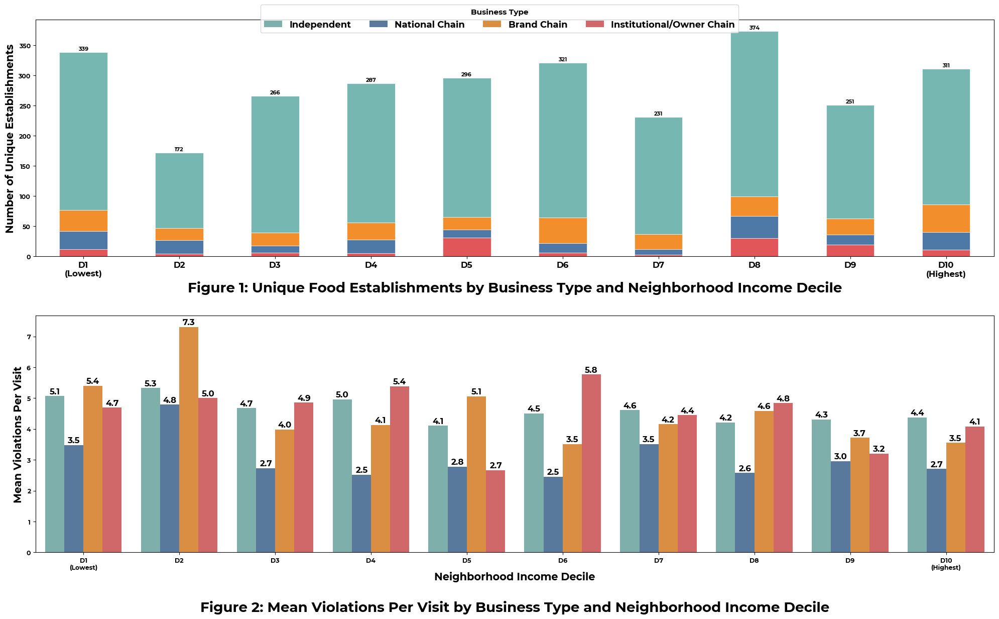

In [40]:
fig, axes = plt.subplots(2, 1, figsize=(20, 12))

# ============================================================
# PLOT 1 (TOP): Unique Establishments
# ============================================================
ax1 = axes[0]

stacked_pivot.plot(
    kind='bar',
    stacked=True,
    color=['#e15759', '#4e79a7', '#f28e2b', '#76b7b2'],
    ax=ax1,
    edgecolor='white',
    linewidth=0.5
)

# Title BELOW the plot using xlabel
# For ax1 — keep normal x axis label
#ax1.set_xlabel('Neighborhood Income Decile', fontsize=15, labelpad=5)
ax1.set_xlabel('Figure 1: Unique Food Establishments by Business Type and Neighborhood Income Decile', fontsize=20, fontweight='bold', labelpad=5)

# Add figure title below the x axis label
#ax1.annotate(
 #   'Figure 1: Unique Food Establishments by Business Type and Neighborhood Income Decile',
 #   xy=(0.5, -0.18),           # position: centered, below x axis
 #   xycoords='axes fraction',  # coordinates relative to the axes
  #  ha='center',
  #  fontsize=20,
  #  fontweight='bold'
#)
ax1.set_ylabel('Number of Unique Establishments', fontsize=15)
ax1.get_legend().remove()
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, fontsize=12)
ax1.tick_params(axis='y', labelsize=9)

totals = stacked_pivot.sum(axis=1)
for i, total in enumerate(totals):
    ax1.text(i, total + 3, str(int(total)), ha='center', fontsize=8, fontweight='bold')

# ============================================================
# PLOT 2 (BOTTOM): Mean Violations
# ============================================================
ax2 = axes[1]

sns.barplot(
    data=grouped_decile,
    x='income_decile',
    y='mean_vpv',
    hue='analysis_group',
    hue_order=['Independent', 'National Chain', 'Brand Chain', 'Institutional/Owner Chain'],
    palette=['#76b7b2', '#4e79a7', '#f28e2b', '#e15759'],
    order=['D1\n(Lowest)', 'D2', 'D3', 'D4', 'D5',
           'D6', 'D7', 'D8', 'D9', 'D10\n(Highest)'],
    ax=ax2
)

# Title BELOW the plot using xlabel
ax2.set_xlabel('Neighborhood Income Decile', fontsize=15, labelpad=1)

ax2.annotate(
    'Figure 2: Mean Violations Per Visit by Business Type and Neighborhood Income Decile',
    xy=(0.5, -0.25),
    xycoords='axes fraction',
    ha='center',
    fontsize=20,
    fontweight='bold'
)
ax2.set_ylabel('Mean Violations Per Visit', fontsize=15)
ax2.get_legend().remove()
ax2.tick_params(axis='both', labelsize=9)

for container in ax2.containers:
    ax2.bar_label(container, fmt='%.1f', padding=1, fontsize=12)

# ============================================================
# SHARED LEGEND AT TOP
# ============================================================
handles, labels = ax2.get_legend_handles_labels()

fig.legend(
    handles, labels,
    title='Business Type',
    loc='upper center',
    bbox_to_anchor=(0.5, 1.02),
    ncol=4,
    fontsize=13,
    title_fontsize=11,
    frameon=True
)

plt.tight_layout(h_pad=3.0)
plt.savefig(
    '/Users/kamilalim/Desktop/Wellesley/Semester_8/DS_340H/Project/combined_decile_plots.png',
    dpi=200, bbox_inches='tight',
    facecolor='white'
)
plt.show()

In [41]:
##### Importing Monserrat font to make it the same font as the rest of the poster
import matplotlib.font_manager as fm

available_fonts = sorted(set([f.name for f in fm.fontManager.ttflist]))
print('Montserrat' in available_fonts)  # should print True

# Also check which weights are available
montserrat_fonts = [f for f in fm.fontManager.ttflist if 'Montserrat' in f.name]
for f in montserrat_fonts:
    print(f.name, f.style, f.weight)

True
Montserrat normal 700
Montserrat normal 700


Montserrat Bold loaded!


/Users/kamilalim/anaconda3/lib/python3.10/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


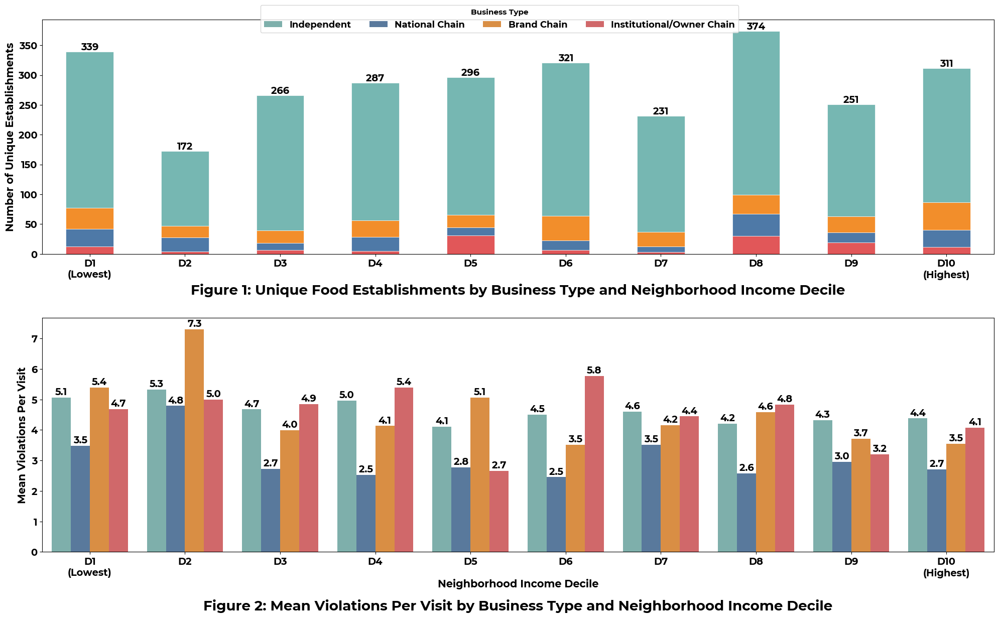

In [47]:
# Same plots as above, but using Montserrat font
# ============================================================
# FONT SETUP
# ============================================================
from matplotlib import font_manager
import os
import matplotlib.pyplot as plt
import seaborn as sns

# Add Montserrat Bold static font directly
font_path = os.path.expanduser('~/Library/Fonts/Montserrat-Bold.ttf')
if os.path.exists(font_path):
    font_manager.fontManager.addfont(font_path)
    prop = font_manager.FontProperties(fname=font_path)
    plt.rcParams['font.family'] = prop.get_name()
    print("Montserrat Bold loaded!")
else:
    plt.rcParams['font.family'] = 'Helvetica'
    print("Montserrat Bold not found — using Helvetica")

plt.rcParams['font.weight'] = 'bold'
plt.rcParams['text.color'] = 'black'
plt.rcParams['axes.labelcolor'] = 'black'
plt.rcParams['xtick.color'] = 'black'
plt.rcParams['ytick.color'] = 'black'

# Font size constants
TITLE_SIZE = 30
LABEL_SIZE = 22
TICK_SIZE = 18
ANNOT_SIZE = 10
BAR_LABEL_SIZE = 14
LEGEND_SIZE = 20

fig, axes = plt.subplots(2, 1, figsize=(20, 12))

# ============================================================
# PLOT 1 (TOP): Unique Establishments
# ============================================================
ax1 = axes[0]

stacked_pivot.plot(
    kind='bar',
    stacked=True,
    color=['#e15759', '#4e79a7', '#f28e2b', '#76b7b2'],
    ax=ax1,
    edgecolor='white',
    linewidth=0.5
)

# Title BELOW the plot using xlabel
# For ax1 — keep normal x axis label
#ax1.set_xlabel('Neighborhood Income Decile', fontsize=15, labelpad=5)
ax1.set_xlabel('Figure 1: Unique Food Establishments by Business Type and Neighborhood Income Decile', fontsize=20, fontweight='bold', labelpad=5)

# Add figure title below the x axis label
#ax1.annotate(
 #   'Figure 1: Unique Food Establishments by Business Type and Neighborhood Income Decile',
 #   xy=(0.5, -0.18),           # position: centered, below x axis
 #   xycoords='axes fraction',  # coordinates relative to the axes
  #  ha='center',
  #  fontsize=20,
  #  fontweight='bold'
#)
ax1.set_ylabel('Number of Unique Establishments', fontsize=15)
ax1.get_legend().remove()
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=0, fontsize=14)
ax1.tick_params(axis='y', labelsize=14)

totals = stacked_pivot.sum(axis=1)
for i, total in enumerate(totals):
    ax1.text(i, total + 3, str(int(total)), ha='center', fontsize=14, fontweight='bold')

# ============================================================
# PLOT 2 (BOTTOM): Mean Violations
# ============================================================
ax2 = axes[1]

sns.barplot(
    data=grouped_decile,
    x='income_decile',
    y='mean_vpv',
    hue='analysis_group',
    hue_order=['Independent', 'National Chain', 'Brand Chain', 'Institutional/Owner Chain'],
    palette=['#76b7b2', '#4e79a7', '#f28e2b', '#e15759'],
    order=['D1\n(Lowest)', 'D2', 'D3', 'D4', 'D5',
           'D6', 'D7', 'D8', 'D9', 'D10\n(Highest)'],
    ax=ax2
)

# Title BELOW the plot using xlabel
ax2.set_xlabel('Neighborhood Income Decile', fontsize=15, labelpad=1)

ax2.annotate(
    'Figure 2: Mean Violations Per Visit by Business Type and Neighborhood Income Decile',
    xy=(0.5, -0.25),
    xycoords='axes fraction',
    ha='center',
    fontsize=20,
    fontweight='bold'
)
ax2.set_ylabel('Mean Violations Per Visit', fontsize=15)
ax2.get_legend().remove()
ax2.tick_params(axis='both', labelsize=14)

for container in ax2.containers:
    ax2.bar_label(container, fmt='%.1f', padding=1, fontsize=14)

# ============================================================
# SHARED LEGEND AT TOP
# ============================================================
handles, labels = ax2.get_legend_handles_labels()

fig.legend(
    handles, labels,
    title='Business Type',
    loc='upper center',
    bbox_to_anchor=(0.5, 1.02),
    ncol=4,
    fontsize=13,
    title_fontsize=11,
    frameon=True
)

plt.tight_layout(h_pad=3.0)

plt.show()